In [13]:
import re
import pandas as pd
import numpy as np
import requests
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
import translators as ts
from ratelimiter import RateLimiter
import nltk
nltk.download(['vader_lexicon','words'])
from nltk.sentiment.vader import SentimentIntensityAnalyzer



[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/davidwhite/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/davidwhite/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [14]:
# Import the City Country data
place_lookup = pd.read_csv('/Users/davidwhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/satc/places_lookup/places_lookup.csv', encoding='utf8')

# for col in ['place']:
#     place_lookup[col] = place_lookup[col].str.encode('mac_roman')

# for col in ['place','country']:
#     place_lookup[col] = place_lookup[col].str.decode('utf8')





#cuba_lookup = cuba_cities[cuba_cities['country'] == 'Cuba']
print(place_lookup)

                      name               country
0             les Escaldes               Andorra
1         Andorra la Vella               Andorra
2           Umm al Qaywayn  United Arab Emirates
3           Ras al-Khaimah  United Arab Emirates
4             Khawr Fakkān  United Arab Emirates
...                    ...                   ...
25604               Harare              Zimbabwe
25605             Bulawayo              Zimbabwe
25606  Mashonaland Central              Zimbabwe
25607   Matabeleland South              Zimbabwe
25608     Distrito Federal                Mexico

[25609 rows x 2 columns]


In [15]:
from sklearn.feature_extraction.text import strip_accents_ascii, strip_accents_unicode

names_list = place_lookup['name'].tolist()

unicode_list=[]
string1=""

for i in (names_list):
    string1 = i
    #print(string1)
    unicode_list.append(strip_accents_ascii(string1))

place_lookup['names_unicode'] = unicode_list
place_lookup.head()

,name,country,names_unicode
0,les Escaldes,Andorra,les Escaldes
1,Andorra la Vella,Andorra,Andorra la Vella
2,Umm al Qaywayn,United Arab Emirates,Umm al Qaywayn
3,Ras al-Khaimah,United Arab Emirates,Ras al-Khaimah
4,Khawr Fakkān,United Arab Emirates,Khawr Fakkan


In [16]:
#The account_language_x_campaign.csv was generated in file "translation.ipynb"
cuba_camp = pd.read_csv('/Users/davidwhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/satc/whitedl/cuba/cuba_082020_users_csv_hashed.csv')

#Function to remove all Emojis
def clean_emoji(tweet):
    tweet = re.sub('[(\U0001F600-\U0001F92F|\U0001F300-\U0001F5FF|\U0001F680-\U0001F6FF|\U0001F190-\U0001F1FF|\U00002702-\U000027B0|\U0001F926-\U0001FA9F|\u200d|\u2640-\u2642|\u2600-\u2B55|\u23cf|\u23e9|\u231a|\ufe0f|\u3030)]+','', tweet)
    tweet = tweet.replace("#", "").replace("_", " ") #Remove hashtag sign but keep the text
    return(tweet)

# Removes Emojis
cuba_camp['user_reported_location'] = cuba_camp['user_reported_location'].astype(str).apply(clean_emoji)

# Cleans up spaces before and after string. 
cuba_camp['user_reported_location'] = cuba_camp['user_reported_location'].str.strip()

# Remove NANs and reset index. .Copy handles a warning error.
cuba_camp = cuba_camp.loc[cuba_camp['user_reported_location'] !='nan'].copy().reset_index()

urlocation_list = cuba_camp['user_reported_location'].tolist()

unicode_list=[]
string1=""

for i in (urlocation_list):
    string1 = i
    #print(string1)
    unicode_list.append(strip_accents_ascii(string1))

cuba_camp['urlocation_unicode'] = unicode_list
cuba_camp.head()

,index,userid,user_display_name,user_screen_name,user_reported_location,user_profile_description,user_profile_url,follower_count,following_count,account_creation_date,account_language,urlocation_unicode
0,1,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,Cuba,Hasta la victoria siempre,NaN,4,19,2018-12-31,en,Cuba
1,5,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,Cienfuegos,NaN,NaN,180,354,2019-05-16,es,Cienfuegos
2,6,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,La Habana,Fiel seguidor de las ideas de #Fidel y de la #...,NaN,34,75,2019-06-25,es,La Habana
3,7,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,Matanzas. Cuba,"Si se pudo, se puede y se podrá. Fiel continua...",NaN,2613,4325,2018-03-19,es,Matanzas. Cuba
4,8,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,"Rancagua, Chile",NaN,NaN,40,49,2020-02-11,en,"Rancagua, Chile"


In [17]:
cuba_camp.replace({'urlocation_unicode':{'Santiago d eCub':'Santiago de Cuba', 'Bejucal, Mayabeque, Cuba':'Bejucal, Cuba', 'Consulado de Cuba en Cancun':'Cancun','Varadero, Matanzas, Cuba':'Varadero, Cuba','La Habana':'La Habana, Cuba'}},inplace=True)

In [18]:
# Parses the location column and splits string into two new columns
cuba_camp[['location_1', 'location_2']] = cuba_camp['urlocation_unicode'].str.split('[,|.]', 1, expand=True)



In [ ]:
sample_list=['Cuba','Chile','Ecuador','Mexico', 'America']


for i in range(0, len(sample_list)):
    cuba_camp['location_2'] = np.where(cuba_camp['location_1'].str.contains(sample_list[i], case=False), sample_list[i], cuba_camp['location_2'])
cuba_camp['location_2'] = cuba_camp['location_2'].fillna(' ').str.replace(r'[^\w\s]+', '')

import re
cuba_camp['location_1'] = cuba_camp['location_1'].str.replace('|'.join(map(re.escape, sample_list)), '', regex=True, case=False)
pd.set_option('display.max_rows', 5000)


cuba_camp['location_1']= cuba_camp['location_1'].replace('','abcxyz',regex = True)
# Replace on all selected columns
cuba_camp['location_2'] = cuba_camp[['location_2']].apply(lambda x: x.str.strip()).replace('', np.nan)


cuba_camp

In [ ]:
names_unicode_list = place_lookup['names_unicode'].tolist()
names_unicode_list

In [ ]:
locations_list = cuba_camp['location_1'].tolist()
locations_list

In [44]:
match_place =[]
match_score = []
locations_list = cuba_camp['location_1'].tolist()
for i in locations_list:
            matches = process.extractOne(i, names_unicode_list, scorer= fuzz.WRatio)

            if matches[1] >= 95:
                #print(matches[1])
                match_place.append(matches[0])

                cuba_camp['match_place'] = pd.Series(match_place)
                print(matches[0])
            else:
                match_place.append(np.nan)
                cuba_camp['match_place'] = pd.Series(match_place)


Cienfuegos
La Habana
Matanzas
Rancagua
Granma
Coquimbo
Camaguey
La Habana
La Habana
Santiago
Bejucal
Distrito Federal
Holguin
La Habana
Santiago
La Habana
La Habana
Rancagua
La Habana
Varadero
Santiago
Holguin
La Habana
Holguin
La Habana
Isla de la Juventud
Cienfuegos
Santiago
Camaguey
Cancun
Matanzas
La Habana
Rancagua
Vina del Mar
Holguin
Matanzas
Pinar del Rio
Cienfuegos
Camaguey
Vina del Mar
La Habana
La Habana
La Habana
La Habana
Camaguey
La Habana
Vina del Mar
Camaguey
Santiago
La Habana
Santiago
Santiago
Santiago
Santiago
Camaguey
La Habana
Camaguey
Bayamo
Yucatan
Villa Clara
Pinar del Rio
La Habana
La Habana
Matanzas
Camaguey
Santiago
Miami
Holguin
Santiago
La Habana
La Serena
Pinar del Rio
Santiago
La Habana
Holguin
La Habana
La Habana
Rancagua
La Habana
Matanzas
La Habana
Coquimbo
La Habana
La Habana
Miami
Camaguey
Camaguey
Holguin
Camaguey
Matanzas
La Habana
Sancti Spiritus
La Habana
Holguin
La Habana
La Habana
Santiago
Rancagua
La Habana
La Habana
Sancti Spiritus
La Habana


In [45]:
cuba_camp

,index,userid,user_display_name,user_screen_name,user_reported_location,user_profile_description,user_profile_url,follower_count,following_count,account_creation_date,account_language,urlocation_unicode,location_1,location_2,match_place,clean_location
0,1,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,Cuba,Hasta la victoria siempre,NaN,4,19,2018-12-31,en,Cuba,abcxyz,Cuba,NaN,Cuba
1,5,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,Cienfuegos,NaN,NaN,180,354,2019-05-16,es,Cienfuegos,Cienfuegos,NaN,Cienfuegos,Cienfuegos
2,6,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,La Habana,Fiel seguidor de las ideas de #Fidel y de la #...,NaN,34,75,2019-06-25,es,"La Habana, Cuba",La Habana,Cuba,La Habana,"La Habana, Cuba"
3,7,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,Matanzas. Cuba,"Si se pudo, se puede y se podrá. Fiel continua...",NaN,2613,4325,2018-03-19,es,Matanzas. Cuba,Matanzas,Cuba,Matanzas,"Matanzas, Cuba"
4,8,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,"Rancagua, Chile",NaN,NaN,40,49,2020-02-11,en,"Rancagua, Chile",Rancagua,Chile,Rancagua,"Rancagua, Chile"
5,9,SX+FY1D6I2xOPIDpyWRzjhzPhrLeh+SMRqJzv4y1Yy4=,SX+FY1D6I2xOPIDpyWRzjhzPhrLeh+SMRqJzv4y1Yy4=,SX+FY1D6I2xOPIDpyWRzjhzPhrLeh+SMRqJzv4y1Yy4=,"Granma, Cuba","Cubano por siempre, amante de su Revolución,\r...",NaN,2185,1943,2012-06-09,es,"Granma, Cuba",Granma,Cuba,Granma,"Granma, Cuba"
6,10,wl5VE9ur1jZvU2OKvmoQQMtGsxOw4aEbcgNGedWC0IM=,wl5VE9ur1jZvU2OKvmoQQMtGsxOw4aEbcgNGedWC0IM=,wl5VE9ur1jZvU2OKvmoQQMtGsxOw4aEbcgNGedWC0IM=,"Coquimbo, Chile",NaN,NaN,47,49,2020-02-13,en,"Coquimbo, Chile",Coquimbo,Chile,Coquimbo,"Coquimbo, Chile"
7,12,POm3H0KxsRV9a7YhSyMYgogqzMe2Zz5EStasMd7on4=,POm3H0KxsRV9a7YhSyMYgogqzMe2Zz5EStasMd7on4=,POm3H0KxsRV9a7YhSyMYgogqzMe2Zz5EStasMd7on4=,Ecuador,"La vida es la memoria del pueblo, la concienci...",NaN,166,276,2018-11-13,es,Ecuador,abcxyz,Ecuador,NaN,Ecuador
8,15,1zpy6+H8pRYVAo5k0kdYgD7EN3Rtk22pYwUYxpQcUak=,1zpy6+H8pRYVAo5k0kdYgD7EN3Rtk22pYwUYxpQcUak=,1zpy6+H8pRYVAo5k0kdYgD7EN3Rtk22pYwUYxpQcUak=,Camagüey,"Amo a mi #Cuba, y por ella todo, adoro los gat...",NaN,1194,2139,2015-03-10,es,Camaguey,Camaguey,NaN,Camaguey,Camaguey
9,16,kwB8M12M2nFYO3yaTdqBsKeYMm6rQ30+Nyt6BohZWdo=,kwB8M12M2nFYO3yaTdqBsKeYMm6rQ30+Nyt6BohZWdo=,kwB8M12M2nFYO3yaTdqBsKeYMm6rQ30+Nyt6BohZWdo=,"La Habana, Cuba",Soy un gran amigo y sobre todo y ante todo un ...,NaN,210,230,2019-02-27,es,"La Habana, Cuba",La Habana,Cuba,La Habana,"La Habana, Cuba"


In [24]:
import pandas as pd                                                                                                                                    
import numpy as np



def func(row):
    if row['match_place'] is np.nan:
        return row['location_2']
    elif row['location_2'] is np.nan:
        return row['match_place']
    else:
        return row[f"{'match_place'}"]+', ' + row[f"{'location_2'}"]

cuba_camp['clean_location'] = cuba_camp.apply(func, axis=1)


In [ ]:
cuba_camp

In [29]:
# frequency count of city and country occurences 
occur = cuba_camp.groupby(['clean_location']).size()
occur.info()

<class 'pandas.core.series.Series'>
Index: 34 entries, America to Yucatan, Mexico
Series name: None
Non-Null Count  Dtype
--------------  -----
34 non-null     int64
dtypes: int64(1)
memory usage: 544.0+ bytes


In [27]:
cuba_camp.replace({'clean_location':{'La Habana':'La Habana, Cuba','Holguin':'Holguin, Cuba','Guadalajara, Jal':'Guadalajara, Mexico'}},inplace=True)


[Text(0.5, 0, 'Counts'),
 Text(0, 0.5, 'Location'),
 Text(0.5, 1.0, 'Cuba Campaign User Reported Locations')]

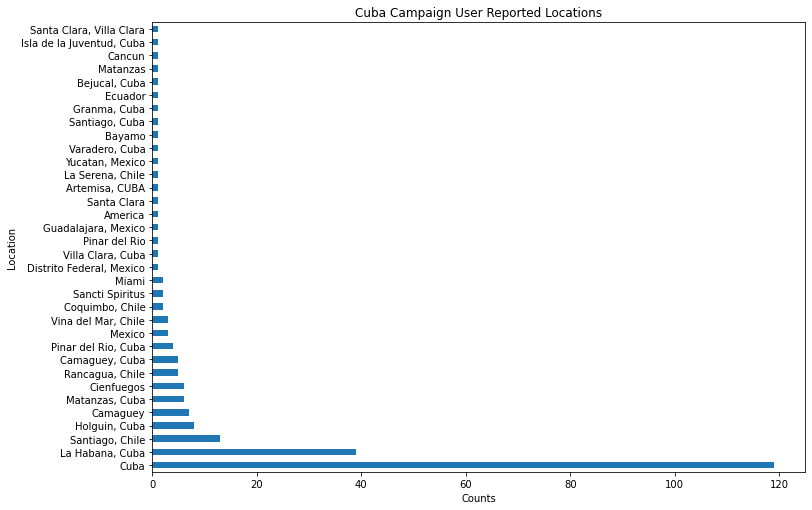

In [31]:

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(11.7,8.27))
ax = cuba_camp.clean_location.value_counts().plot(kind='barh')
ax.set(xlabel='Counts', ylabel='Location', title='Cuba Campaign User Reported Locations')


In [ ]:
#Column Names
cols = ['lat','lng','countryCode','countryName','clean_location']

#Geocode List
geocode = []


# Form a list of locations for geocoding:
# Make a big list of all of the locations to be processed.
locations = cuba_camp['clean_location'].tolist()


# Loop based on the CSV file that contains the locations to be geocoded
iter_len=len(cuba_camp)
for q in range(iter_len):
    # Defines the Rest API
    geocode_url = "https://geocode.search.hereapi.com/v1/geocode?q={}".format(locations[q]) + "&apikey=nacXHor6-tXlB5zT96YYP0iWi83i6E-kntlARVQOK48"
    try:
        results = requests.get(geocode_url)
        #print('THIS IS THE CURRENT URL:', geocode_url), '\n'

    except requests.exceptions.RequestException as err:
        repr(err)

    else:
        results = results.json()
        #print('Dictionary Results:',results)
        if 'items' not in results: 
            output = ('NULL','NULL','NULL','NULL',locations[q])
            print('NULL OUTPUT:', output), '\n'
            #append_list_as_row(output_filename, output)
            geocode.append(results)
            continue
        

    if results['items'] == []:
        output = ('NULL','NULL','NULL','NULL',locations[q])
        print('NULL OUTPUT:', output), '\n'
        #append_list_as_row(output_filename, output)
        geocode.append(results)
        continue
                
    else:
        output = (    
        results['items'][0]['position']['lat'],
        results['items'][0]['position']['lng'],
        results['items'][0]['address']['countryCode'],
        results['items'][0]['address']['countryName'],
        locations[q]
        )
        geocode.append(output)


print(geocode)


In [ ]:
# uses the updated geocoded list to create a df and drop duplicates
geocode = pd.DataFrame(geocode, columns=cols)
# unique is needed to populated the final data set
geocode_unique = geocode.drop_duplicates()
geocode_unique

In [ ]:
# Join back to the original geocode data 
cuba_camp_geocode = pd.merge(cuba_camp, geocode_unique, on='clean_location', how='left')

#topic_wide_geocode_merged = inner_join_df= pd.merge(user_ids_locations_out, topic_wide,  on='user_reported_location', how='outer')
cuba_camp_geocode.head(55)

In [36]:
# assign mp to the geojson data
# GeoJson generator is here. https://geojson-maps.ash.ms
import json
with open('/Users/davidwhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/satc/whitedl/cuba/na.geo.json', 'r') as geo:
      mp_1 = json.load(geo)

import plotly.express as px
fig = px.scatter_geo(cuba_camp_geocode, geojson=mp_1, lat='lat', lon='lng',
                           #color_continuous_scale="reds",
                           #range_color=(0, 12),
                           #mapbox_style="carto-positron",
                           #center = {"lat": 23.6, "lon": -102.6},
                           scope='north america'
                           
                           #labels={'count':'Counts'},
                           #range_color=(0, 120000),
                           #animation_frame="date_t",
                           #featureidkey="properties.iso_a3"
                           
                          )
fig.update_layout(
        geo = dict(
            projection_scale=5, #this is kind of like zoom
            center=dict(lat=22, lon=-79), # this will center on the point
        ))

fig.show()

# Sentiment of User Description

In [ ]:
#Translates User_Reported_Location for mixed language data. Writes data to a CSV file

# #Defines the output file name
# output_filename = '/Users/davidwhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/satc/whitedl/cuba/hashed_2021_12_MX_0621_MX_0621_users_csv_hashed_translate.csv'

# #CSV writer
# def append_list_as_row(output_filename, translate_detect):
#     # Open file in append mode
#     with open(output_filename, 'a+', newline='') as write_obj:
#         # Create a writer object from csv module
#         csv_writer = writer(write_obj)
#         # Add contents of list as last row in the csv file
#         csv_writer.writerow(translate_detect)

#Column Names
cols = ['hashed_userid','user_reported_location','translate','account_language','creation_date','follower_count','following_count']

#Creates an empty list
language_translate = []

#Rate Limiter to not get booted from the API (period = seconds)
rate_limiter = RateLimiter(max_calls=60, period=60)

#Iterates through each row to translate to english. 
iter_len=len(cuba_camp)
for q in range(iter_len):
    with rate_limiter:

        try:
            translate = cuba_camp.user_profile_description[q]
            translate_detect = (cuba_camp.userid[q], cuba_camp.user_reported_location[q], ts.google(translate), cuba_camp.account_language[q], cuba_camp.account_creation_date[q], cuba_camp.follower_count[q], cuba_camp.following_count[q])
            print(translate_detect)
            language_translate.append(translate_detect)
            #append_list_as_row(output_filename, translate_detect)
        except:
            #print('TRANSLATION ERROR')
            translate_detect = (cuba_camp.userid[q], cuba_camp.user_reported_location[q], 'TRANSLATION ERROR', cuba_camp.account_language[q], cuba_camp.account_creation_date[q], cuba_camp.follower_count[q], cuba_camp.following_count[q])
            print(translate_detect)
            language_translate.append(translate_detect)
            #append_list_as_row(output_filename, translate_detect
            continue

cuba_camp_translate = pd.DataFrame(language_translate, columns=cols)


cuba_camp_translate.head(10)
# # A quick hack to get column labels. 
# cuba_camp_translate = pd.read_csv('hashed_2021_12_MX_0621_MX_0621_users_csv_hashed_translate.csv', header=None, names=['hashed_userid','user_reported_location','translate','account_language','creation_date','follower_count','following_count'])
# cuba_camp_translate.to_csv('hashed_2021_12_MX_0621_MX_0621_users_csv_hashed_translate.csv')

In [ ]:
# Cleans up the text for sentiment processing
# https://www.natasshaselvaraj.com/twitter-sentiment-analysis-with-python/

words = set(nltk.corpus.words.words())
def cleaner(tweet):
    tweet = re.sub("@[A-Za-z0-9]+","",tweet) #Remove @ sign
    tweet = re.sub(r"(?:\@|http?\://|https?\://|www)\S+", "", tweet) #Remove http links
    tweet = " ".join(tweet.split())
    tweet = tweet.replace("#", "").replace("_", " ") #Remove hashtag sign but keep the text
    tweet = " ".join(w for w in nltk.wordpunct_tokenize(tweet)
         if w.lower() in words or not w.isalpha())
    return tweet
    

cuba_camp_translate['user_desc_clean'] = cuba_camp_translate['translate'].apply(cleaner)
#cuba_camp_translate['user_location_clean'] = str(cuba_camp_translate['user_reported_location'].apply(cleaner))
#print(cuba_camp_translate['tweet_clean'])
cuba_camp_translate.head(50)

In [39]:
# Sentiment calculation
# https://www.natasshaselvaraj.com/twitter-sentiment-analysis-with-python/

# word_dict = {'manipulate':-1,'manipulative':-1,'jamescharlesiscancelled':-1,'jamescharlesisoverparty':-1,
#             'pedophile':-1,'pedo':-1,'cancel':-1,'cancelled':-1,'cancel culture':0.4,'teamtati':-1,'teamjames':1,
#             'teamjamescharles':1,'liar':-1}

sid = SentimentIntensityAnalyzer()
sentiment_list = []
for i in cuba_camp_translate['user_desc_clean']:
     sentiment_list.append((sid.polarity_scores(str(i)))['compound'])

In [40]:

# Sentiment calculation
# https://www.natasshaselvaraj.com/twitter-sentiment-analysis-with-python/# add named categories to sentiment 
cuba_camp_translate['sentiment'] = pd.Series(sentiment_list)
cuba_camp_translate.head()

,hashed_userid,user_reported_location,translate,account_language,creation_date,follower_count,following_count,user_desc_clean,sentiment
0,lphZn35n7SSfX5a1vbWlh13Vwmy0YeJLbypJl5QBhFI=,Cuba,Ever onward to victory,en,2018-12-31,4,19,Ever onward to victory,0.0000
1,kdjv+e54SzcFBzA52E+PhPqpJ+kjDZw2AT5gQ4BmGLo=,Cienfuegos,TRANSLATION ERROR,es,2019-05-16,180,354,TRANSLATION ERROR,-0.4019
2,8ciGccxFAJ2290jedXVBjQbXD3iDUpKcbTaTs5v+X94=,La Habana,Faithful follower of the ideas of #fidel and t...,es,2019-06-25,34,75,Faithful follower of the of and the,0.4404
3,4q5hegNPVUp0VByRZXmXVErweWoQxUi8iIfGavbSaM=,Matanzas. Cuba,"If it could, you can and can. Faith continuato...",es,2018-03-19,2613,4325,"If it could , you can and can . Faith continua...",0.4215
4,iAi7E7IspburgAr4Y0cPAUwEOR+YCKZNUrNxoswsTf8=,"Rancagua, Chile",TRANSLATION ERROR,en,2020-02-11,40,49,TRANSLATION ERROR,-0.4019


In [42]:

# Sentiment calculation
# https://www.natasshaselvaraj.com/twitter-sentiment-analysis-with-python/# add named categories to sentiment 
cuba_camp_translate['sentiment'] = pd.Series(sentiment_list)

def sentiment_category(sentiment):
    label = ''
    if(sentiment>0):
        label = 'positive'
    elif(sentiment == 0):
        label = 'neutral'
    else:
        label = 'negative'
    return(label)

cuba_camp_translate['sentiment_category'] = cuba_camp_translate['sentiment'].apply(sentiment_category)

In [43]:
# plot sentiment
cuba_camp_sent_plot = cuba_camp_translate.loc[cuba_camp_translate['user_desc_clean'] !='TRANSLATION ERROR']
dfg = cuba_camp_sent_plot.groupby('sentiment_category').count()
dfg
fig = px.bar(x=dfg.index, y=dfg.sentiment)
fig.show()